# First, align acceleration data with pressure data using index

create latent space for both data, then evaluate the position of segments at different figures.

use index to align latent space and raw data of acc and pressure.

In [1]:
import os

import matplotlib.pyplot as plt

import torch.optim as optim
from umap import UMAP
import plotly.express as px
import random
import pickle
import numpy as np
from tqdm import tqdm
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader

from deepview.calculate_results.data.umineko_data import (
    read_umineko_data,
    read_umineko_path,
    extract_data_from_year_back,
    label_dict,
    get_accel_batch_data,
)

from deepview.calculate_results.models.utils import (
    Resnet,
    sliding_window,
    data_loader_umineko,
    load_weights,
    MSEloss,
    MSEloss_weighted,
    # torch,
    AE_eval_time_series,
    AE_train_time_series_resnet,
    AE_train_time_series,
    majority_value,
    # np,
    adjust_learning_rate,
    # tqdm
    Autoencoder3d,
    Autoencoder1d,
    Autoencoder2d,
    Autoencoder3d4,
    plot_reconstruction_result,
)

def set_random_seed(seed):
    # Set seed for Python's random module
    random.seed(seed)

    # Set seed for NumPy
    np.random.seed(seed)

    # Set seed for PyTorch
    torch.manual_seed(seed)

    # If using CUDA, set seed for GPU as well
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # For multi-GPU setups

# Set a fixed random seed
seed_value = 2025
set_random_seed(seed_value)

def gaussian_std(X):
    mean_val = np.mean(X.astype(float), axis=0)
    std_val = np.std(X.astype(float), axis=0)
    X_standardized = (X - mean_val) / np.maximum(std_val, 10 ** -5)
    return X_standardized

back_label_path = r'D:\logbot-data\BioTaggerData\masterLabelsByOtsuka\animal_id.csv'
umi_root_path = r'D:\logbot-data\BioTaggerData\export\raw\umineko\v.1.0.0'
file_paths = read_umineko_path(umi_root_path)

year = '2018'
data_path = r'D:\code\DeepView\deepview\calculate_results\data\umineko_%s.npy' % year
if os.path.exists(data_path):
    tmp = np.load(data_path, allow_pickle='TRUE').item()
    df_list = tmp['raw_data']
    df_clean_list = tmp['labeled_data']

selected_df, selected_clean_df = (
    extract_data_from_year_back(df_list, df_clean_list, 1))

selected_df['label_id'] = selected_df['label'].map(label_dict)
selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)

# 将df_list没有标签的位置赋值-2，标记灰色，其他label正常标记。观察是否有label的标记能在不同灰色cluster中
# Replace NaN with -2 in column A
selected_df['label_id'] = selected_df['label_id'].fillna(-2)


C:\Users\dell\AppData\Local\Temp\ipykernel_7768\3403185300.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['label_id'] = selected_df['label'].map(label_dict)
C:\Users\dell\AppData\Local\Temp\ipykernel_7768\3403185300.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)
C:\Users\dell\AppData\Local\Temp\ipykernel_7768\3403185300.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

# get detailed label id

In [132]:
detail_label_dict = {
    'ground_stationary': 0,  #  if a bird is resting on the ground, including standing
    'stationary': 1,#0,  #  if a bird is resting on the sea surface
    'preening': 2,#0,
    'bathing': 3,#1,
    'bathing_poss': 4,#1,
    'flight_take_off': 5,#4,
    'flying_active': 6,#2,  # flying active -> flapping
    'flying_passive': 7,#2,  # flying passive -> flying without flapping, including gliding
    'unknown': -2,  #-1
}

selected_df['detail_label_id'] = selected_df['label'].map(detail_label_dict)
# selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)

# 将df_list没有标签的位置赋值-2，标记灰色，其他label正常标记。观察是否有label的标记能在不同灰色cluster中
# Replace NaN with -2 in column A
selected_df['detail_label_id'] = selected_df['detail_label_id'].fillna(-2)

C:\Users\dell\AppData\Local\Temp\ipykernel_7768\2903514136.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dell\AppData\Local\Temp\ipykernel_7768\2903514136.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [133]:
prss_statistic_pd = selected_df[['pressure', 'detail_label_id']]

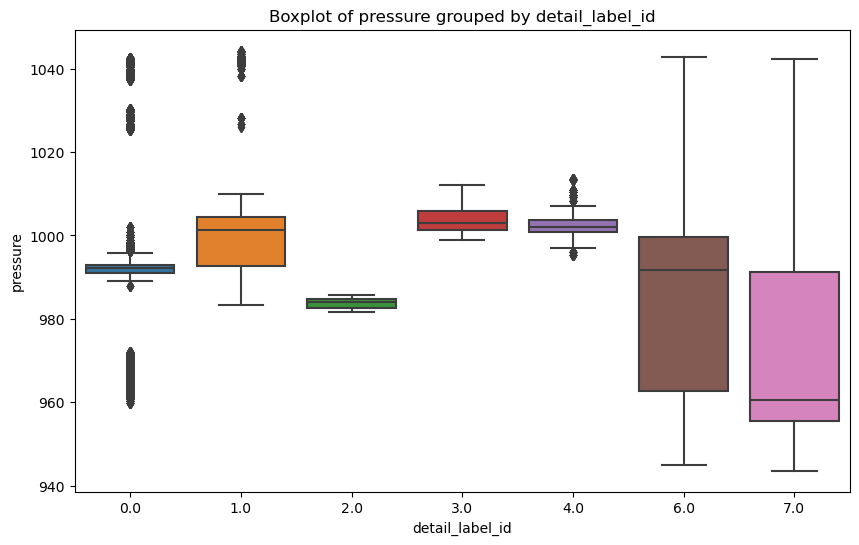

In [155]:
# import pandas as pd
# import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = prss_statistic_pd[prss_statistic_pd['detail_label_id'] != -2]

# 使用Seaborn绘制箱线图
plt.figure(figsize=(10, 6))
sns.boxplot(x='detail_label_id', y='pressure', data=df_filtered)

# 添加标题和标签
plt.title('Boxplot of pressure grouped by detail_label_id')
plt.ylabel('pressure')
plt.xlabel('detail_label_id')

# 显示图形
plt.show()

In [2]:
selected_df.head(2)

,datetime,unixtime,logger_id,animal_tag,timestamp,acc_x,acc_y,acc_z,latitude,longitude,...,pressure,temperature,activity_class,label,year,back,species,label_id,GPS_velocity,GPS_bearing
0,2018-05-25 01:02:05,1.527210e+09,lb0001,LB07,2018-05-25T01:02:05.000Z,0.811523,-0.028564,-0.071533,NaN,NaN,...,988.000000,26.620001,NaN,<NA>,2018.0,1.0,umineko,-2.0,0.0,0.0
1,2018-05-25 01:02:05.040000,1.527210e+09,lb0001,LB07,2018-05-25T01:02:05.040Z,0.863281,-0.050781,-0.047607,NaN,NaN,...,990.599976,26.629999,NaN,<NA>,2018.0,1.0,umineko,-2.0,0.0,0.0


In [11]:
selected_columns = ['acc_x', 'acc_y', 'acc_z', 'pressure', 'label_id', 'animal_tag']
label_np = selected_df['label_id'].values
file_np = selected_df['animal_tag'].values
accel_np = selected_df[['acc_x', 'acc_y', 'acc_z']].values
press_np = selected_df['pressure'].values

len_sw = 300
print(label_np.shape)
print(accel_np.shape)
print(press_np.shape)

(8404650,)
(8404650, 3)
(8404650,)


In [20]:
label_win = sliding_window(label_np.reshape(-1,1), len_sw, len_sw)
label_win.shape

(28015, 300, 1)

In [18]:
# len_sw = 300

def forward_fill(arr):
    for i in range(1, len(arr)):
        if np.isnan(arr[i]):
            arr[i] = arr[i - 1]
    return arr

data_np = forward_fill(press_np.astype(float))
percentile_99 = np.percentile(data_np, 99.9)
data_np[data_np > percentile_99] = percentile_99
percentile_1 = np.percentile(data_np, 0.1)
data_np[data_np < percentile_1] = percentile_1
tmp_b_stand = gaussian_std(data_np)
press_win = sliding_window(tmp_b_stand.reshape(-1,1), len_sw, len_sw)
press_win.shape

(28015, 300, 1)

In [30]:
batch_size = 512
device = 'cuda:1'

data_b = np.transpose(press_win, (0, 2, 1))  # [B, Len, dim-1] -> [B, dim-1, Len]

train_set_r = data_loader_umineko(data_b.astype(float), label_win.astype(int), device=device)
train_press_loader = DataLoader(train_set_r, batch_size=batch_size,
                          shuffle=False, drop_last=False)

In [31]:
data_np = accel_np
tmp_b_stand = gaussian_std(data_np)
acc_win = sliding_window(tmp_b_stand, len_sw, len_sw)

data_b = np.transpose(acc_win, (0, 2, 1))  # [B, Len, dim-1] -> [B, dim-1, Len]
train_set_r = data_loader_umineko(data_b.astype(float), label_win.astype(int), device=device)
train_acc_loader = DataLoader(train_set_r, batch_size=batch_size,
                          shuffle=False, drop_last=False)

In [33]:
data_b.shape

(28015, 3, 300)

# prepare models to get latent representations

In [38]:
accmodel = Autoencoder3d()
accmodel = accmodel.to(device)
full_model_path = r'D:\code\DeepView\deepview\calculate_results\viz\AE_reconstruct_epoch999_datalen300_accel.pth'
if torch.cuda.is_available():
    accmodel.load_state_dict(torch.load(full_model_path, weights_only=False))
else:
    accmodel.load_state_dict(torch.load(full_model_path, weights_only=False, map_location=torch.device('cpu')))

criterion = MSEloss_weighted()
criterion = criterion.to(device)

learning_rate = 0.001

accoptimizer = optim.Adam(accmodel.parameters(), lr=learning_rate, weight_decay=1e-5)
accscheduler = torch.optim.lr_scheduler.CosineAnnealingLR(accoptimizer, T_max=50)

accrepresentation_list, accsample_list, pred_list, label_list = \
            AE_eval_time_series(train_acc_loader, accmodel, device)
# plot_reconstruction_result(representation_list, sample_list, pred_list, label_list, 'train_epoch_%s' % str(0))

In [39]:

pressmodel = Autoencoder1d()
pressmodel = pressmodel.to(device)
full_model_path = r'D:\code\DeepView\deepview\calculate_results\viz\AE_reconstruct_epoch799_datalen300_pressure.pth'
if torch.cuda.is_available():
    pressmodel.load_state_dict(torch.load(full_model_path, weights_only=False))
else:
    pressmodel.load_state_dict(torch.load(full_model_path, weights_only=False, map_location=torch.device('cpu')))
    

pressoptimizer = optim.Adam(pressmodel.parameters(), lr=learning_rate, weight_decay=1e-5)
pressscheduler = torch.optim.lr_scheduler.CosineAnnealingLR(pressoptimizer, T_max=50)

pressrepresentation_list, presssample_list, pred_list, label_list = \
            AE_eval_time_series(train_press_loader, pressmodel, device)
   

In [86]:
repre_concat = np.concatenate(accrepresentation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

sample_concat = np.concatenate(accsample_list)
sample_concat = sample_concat.transpose(0, 2, 1)
sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

umap_3d = UMAP(n_components=2)
acc_2d = umap_3d.fit_transform(repre_reshape)

label_concat = np.concatenate(label_list)
label_concat_vote = majority_value(label_concat)

# create a dict from actID to act:
labeldict_findstr = {-2: 'unknown',
                     0:'stationary',
                     1:'bathing',
                     2:'flying',
                     13:'ground_active'}
label_concat_vote_str = [labeldict_findstr[i] for i in label_concat_vote]
# label_concat_vote_str = np.char.mod('%d', label_concat_vote)
index_str = np.arange(0,acc_2d.shape[0],1)

proj_pd = pd.DataFrame({
    'x': acc_2d[:,0],  # Random x values
    'y': acc_2d[:,1],  # Random y values
    'activity': label_concat_vote_str,
    'index_str': index_str,
})

fig_3d = px.scatter(
    proj_pd, x='x', y='y',
    color=label_concat_vote_str,
    labels={'color': 'activity'},
    color_discrete_map={'unknown': 'lightgrey'},
    hover_name='index_str',  # Show index label on hover
    hover_data={'index_str': False}  # Do not show it as a separate entry
)
# Reduce marker size for all points
for trace in fig_3d.data:
    trace.marker.size = 6  # Adjust the size to your preference (e.g., 6)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())
fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point
fig_3d.show()
# fig_3d.write_html("presstest.html")

In [57]:
sample_concat.shape

(15872, 300, 3)

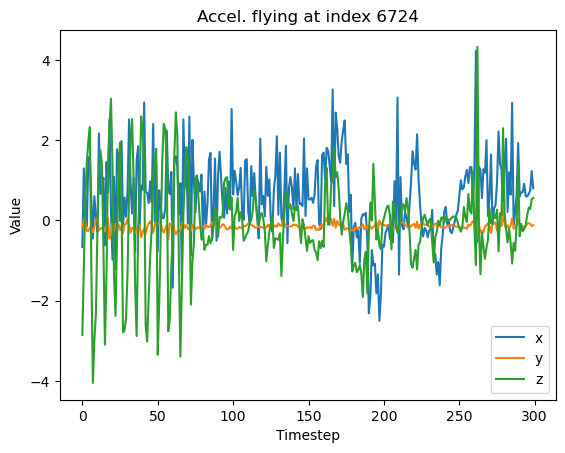

In [85]:
fig = plt.figure()
idx = 6724
plt.plot(sample_concat[idx,:,0], label='x')
plt.plot(sample_concat[idx,:,1], label='y')
plt.plot(sample_concat[idx,:,2], label='z')
plt.xlabel('Timestep')
plt.ylabel('Value')
plt.title('Accel. flying at index %s'%str(idx))
plt.legend()
fig.patch.set_facecolor('white')  # Change figure background
plt.show()

In [87]:
repre_concat = np.concatenate(pressrepresentation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

# sample_concat = np.concatenate(presssample_list)
# sample_concat = sample_concat.transpose(0, 2, 1)
# sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

umap_3d = UMAP(n_components=2)
press_2d = umap_3d.fit_transform(repre_reshape)

proj_pd = pd.DataFrame({
    'x': press_2d[:,0],  # Random x values
    'y': press_2d[:,1],  # Random y values
    'activity': label_concat_vote_str,
    'index_str': index_str,
})

fig_3d = px.scatter(
    proj_pd, x='x', y='y',
    color=label_concat_vote_str,
    labels={'color': 'activity'},
    color_discrete_map={'unknown': 'lightgrey'},
    hover_name='index_str',  # Show index label on hover
    hover_data={'index_str': False}  # Do not show it as a separate entry
)
# Reduce marker size for all points
for trace in fig_3d.data:
    trace.marker.size = 6  # Adjust the size to your preference (e.g., 6)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())
fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point
fig_3d.show()
# fig_3d.write_html("presstest.html")

# 两个scatter图中，任意配对的距离是否存在相关性

比如任意两个点activity A和A的距离。横轴是acc的距离，纵轴是pressure距离

In [112]:

# get only labeled data
indices_0 = np.where((label_concat_vote == 0) & (acc_2d[:, 0] > -0.072)  & (acc_2d[:, 0] < 2.87)  & (acc_2d[:, 1] > 10.03)  & (acc_2d[:, 1] < 12.81))[0]
# indices_no0 = np.where((label_concat_vote == 0) & (label_concat_vote != -2))[0]
indices_1 = np.where((label_concat_vote == 2) & (acc_2d[:, 0] > -0.072)  & (acc_2d[:, 0] < 2.87)  & (acc_2d[:, 1] > 10.03)  & (acc_2d[:, 1] < 12.81))[0]

# calculate pair distance of press_2d
press_2d_0 = press_2d[indices_0, :]
press_2d_1 = press_2d[indices_1, :]
# calculate pair distance of acc_2d
acc_2d_0 = acc_2d[indices_0, :]
acc_2d_1 = acc_2d[indices_1, :]


In [114]:
indices_0.shape

(31,)

In [115]:
# pair wise distances between activity 0 and 1

# Calculate pairwise distances using broadcasting
# Expand dimensions to enable broadcasting
A_expanded = acc_2d_0[:, np.newaxis, :]  # Shape (n, 1, 2)
B_expanded = acc_2d_1[np.newaxis, :, :]  # Shape (1, n, 2)

# Calculate the squared differences
squared_diff = (A_expanded - B_expanded) ** 2

# Sum the squared differences along the last axis to get squared distances
squared_distances = np.sum(squared_diff, axis=-1)

# Take the square root to get the actual distances
acc_dist_01 = np.sqrt(squared_distances)

# Output the result
# print("Pairwise distances between points in A and B:\n", acc_dist_01)

In [116]:
acc_dist_01.shape

(31, 5)

In [117]:
# pair wise distances between activity 0 and 0

# Calculate pairwise distances using broadcasting
# Expand dimensions to enable broadcasting
A_expanded = acc_2d_0[:, np.newaxis, :]  # Shape (n, 1, 2)
B_expanded = acc_2d_0[np.newaxis, :, :]  # Shape (1, n, 2)

# Calculate the squared differences
squared_diff = (A_expanded - B_expanded) ** 2

# Sum the squared differences along the last axis to get squared distances
squared_distances = np.sum(squared_diff, axis=-1)

# Take the square root to get the actual distances
acc_dist_00 = np.sqrt(squared_distances)

# Output the result
# print("Pairwise distances between points in A and B:\n", acc_dist_01)

In [118]:
acc_dist_00.shape

(31, 31)

In [119]:
# average
np.average(acc_dist_00.reshape(-1))

1.336449

In [120]:
np.average(acc_dist_01.reshape(-1))

1.3514541

In [121]:
# pair wise distances between activity 0 and 1

# Calculate pairwise distances using broadcasting
# Expand dimensions to enable broadcasting
A_expanded = press_2d_0[:, np.newaxis, :]  # Shape (n, 1, 2)
B_expanded = press_2d_1[np.newaxis, :, :]  # Shape (1, n, 2)

# Calculate the squared differences
squared_diff = (A_expanded - B_expanded) ** 2

# Sum the squared differences along the last axis to get squared distances
squared_distances = np.sum(squared_diff, axis=-1)

# Take the square root to get the actual distances
press_dist_01 = np.sqrt(squared_distances)

# Output the result
# print("Pairwise distances between points in A and B:\n", press_dist_01)

In [122]:
# pair wise distances between activity 0 and 0

# Calculate pairwise distances using broadcasting
# Expand dimensions to enable broadcasting
A_expanded = press_2d_0[:, np.newaxis, :]  # Shape (n, 1, 2)
B_expanded = press_2d_0[np.newaxis, :, :]  # Shape (1, n, 2)

# Calculate the squared differences
squared_diff = (A_expanded - B_expanded) ** 2

# Sum the squared differences along the last axis to get squared distances
squared_distances = np.sum(squared_diff, axis=-1)

# Take the square root to get the actual distances
press_dist_00 = np.sqrt(squared_distances)

# Output the result
# print("Pairwise distances between points in A and B:\n", press_dist_01)

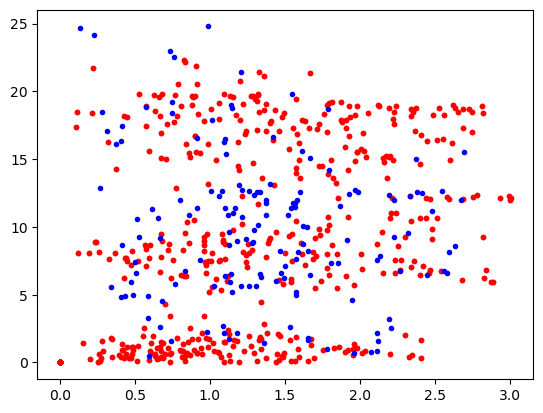

In [125]:

plt.figure()
plt.plot(acc_dist_00.reshape(-1), press_dist_00.reshape(-1), 'r.')
plt.plot(acc_dist_01.reshape(-1), press_dist_01.reshape(-1), 'b.')
plt.show()
# acc_dist_00

In [130]:
def norm(arr):
    min_val = np.min(arr)  # 找到最小值
    max_val = np.max(arr)  # 找到最大值
    normalized_arr = (arr - min_val) / (max_val - min_val)
    return normalized_arr

In [131]:
from scipy.stats import pearsonr
correlation_coefficient, _ = pearsonr(norm(acc_dist_00.reshape(-1)), norm(press_dist_00.reshape(-1)))
correlation_coefficient

0.328852216629439

# plot detailed labels

In [149]:
data_b = np.transpose(press_win, (0, 2, 1))  # [B, Len, dim-1] -> [B, dim-1, Len]
dlabel_np = selected_df['detail_label_id'].values
dlabel_win = sliding_window(dlabel_np.reshape(-1,1), len_sw, len_sw)
train_set_r = data_loader_umineko(data_b.astype(float), dlabel_win.astype(int), device=device)
train_pressd_loader = DataLoader(train_set_r, batch_size=batch_size,
                          shuffle=False, drop_last=False)
_, _, _, dlabel_list = \
            AE_eval_time_series(train_pressd_loader, pressmodel, device)

dlabel_concat = np.concatenate(dlabel_list)
dlabel_concat_vote = majority_value(dlabel_concat)
# create a dict from actID to act:
dlabeldict_findstr = {-2: 'unknown',
                     0:'ground_stationary',
                     1:'stationary',
                     2:'preening',
                     3:'bathing',
                     4:'bathing_poss',
                     5:'flight_take_off',
                     6:'flying_active',
                     7:'flying_passive'}
dlabel_concat_vote_str = [dlabeldict_findstr[i] for i in dlabel_concat_vote]

In [151]:
len(dlabel_concat_vote_str)

15872

In [153]:
proj_pd = pd.DataFrame({
    'x': press_2d[:,0],  # Random x values
    'y': press_2d[:,1],  # Random y values
    'activity': dlabel_concat_vote_str,
    'index_str': index_str,
})

fig_3d = px.scatter(
    proj_pd, x='x', y='y',
    color=dlabel_concat_vote_str,
    labels={'color': 'activity'},
    color_discrete_map={'unknown': 'lightgrey'},
    hover_name='index_str',  # Show index label on hover
    hover_data={'index_str': False}  # Do not show it as a separate entry
)
# Reduce marker size for all points
for trace in fig_3d.data:
    trace.marker.size = 6  # Adjust the size to your preference (e.g., 6)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())
fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point
fig_3d.show()
# fig_3d.write_html("presstest.html")

In [154]:
proj_pd = pd.DataFrame({
    'x': acc_2d[:,0],  # Random x values
    'y': acc_2d[:,1],  # Random y values
    'activity': dlabel_concat_vote_str,
    'index_str': index_str,
})

fig_3d = px.scatter(
    proj_pd, x='x', y='y',
    color=dlabel_concat_vote_str,
    labels={'color': 'activity'},
    color_discrete_map={'unknown': 'lightgrey'},
    hover_name='index_str',  # Show index label on hover
    hover_data={'index_str': False}  # Do not show it as a separate entry
)
# Reduce marker size for all points
for trace in fig_3d.data:
    trace.marker.size = 6  # Adjust the size to your preference (e.g., 6)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())
fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point
fig_3d.show()
# fig_3d.write_html("presstest.html")